**This notebook still has to be formatted and completed**

In [0]:
#Import
import pandas as pd
df_binary = pd.read_csv("https://drive.switch.ch/index.php/s/jBrNwNiAGh7LcXX/download")

In [2]:
df_binary

,Inspection ID,DBA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude
0,2345619,JAIPUR,2694084,restaurant,Risk 1 (High),738 W RANDOLPH ST,60661,2019-11-14,canvass,Pass,NaN,41.884518,-87.647304
1,2345585,BANQUET ON ROCKWELL,2583535,restaurant,Risk 2 (Medium),6415 N ROCKWELL ST,60659,2019-11-14,canvass,Pass,NaN,41.998135,-87.694635
2,2345463,KABOBI,2313793,restaurant,Risk 1 (High),4748 N KEDZIE AVE,60625,2019-11-12,canvass,Fail,2. CITY OF CHICAGO FOOD SERVICE SANITATION CER...,41.968077,-87.708607
3,2321192,FATHER & SON PIZZERIA LTD,23515,restaurant,Risk 1 (High),2475 N MILWAUKEE AVE,60647,2019-11-06,canvass,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.926342,-87.702724
4,2320778,THE MARKET,2511404,restaurant,Risk 1 (High),5700 S CICERO AVE,60638,2019-10-30,canvass,Pass,"55. PHYSICAL FACILITIES INSTALLED, MAINTAINED ...",41.789329,-87.741646
...,...,...,...,...,...,...,...,...,...,...,...,...,...
139216,659247,LE MOYNE FAMILY MARKET,2036960,grocery store,Risk 3 (Low),3358 W LE MOYNE ST,60651,2011-11-08,short form fire-complaint,Pass,NaN,41.908336,-87.711729
139217,491210,THREE R FOOD,1943396,grocery store,Risk 1 (High),2712-2714 W MONTROSE AVE,60618,2011-01-15,short form fire-complaint,Fail,NaN,41.961371,-87.696669
139218,598319,WAGNER'S BAKERY,1195799,bakery,Risk 2 (Medium),2148 W CERMAK RD,60608,2011-08-15,short form fire-complaint,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,41.852216,-87.680244
139219,634970,LEONA'S,41593,wholesale,Risk 1 (High),3931 S LEAVITT ST,60609,2011-10-14,short form fire-complaint,Pass,NaN,41.822136,-87.679851


In [0]:
# Date conversion
df_binary["Inspection Date"] =  pd.to_datetime(df_binary["Inspection Date"])

In [4]:
#Zip visualisation
zipList = list(df_binary["Zip"].unique())
print(min(zipList))
print(max(zipList))

60148
60827


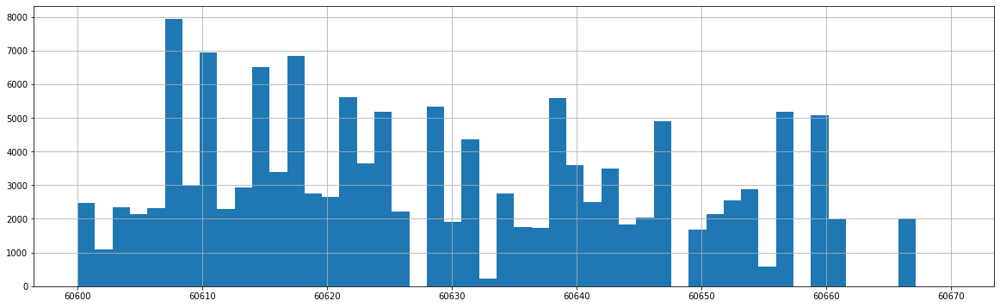

In [5]:
#Zip codes distribution (manually reduced the range as most zip codes are between 60600 and 60670)
df_binary["Zip"].hist(range = (60600, 60670), figsize = (20,6), bins = 50)

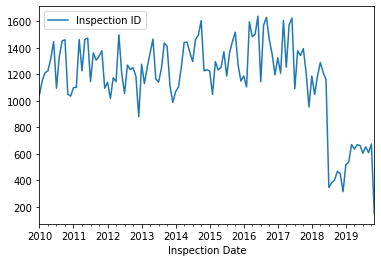

In [6]:
#Inspection date visualisation (we see an important drop in july 2018 which corresponds to the legislation changes)
pivot_date = pd.pivot_table(data = df_binary, index = "Inspection Date", values = "Inspection ID", aggfunc = "count")
pivot_date.resample('1M').sum().plot()

In [0]:
#Split DF according to year and inspection result
from datetime import datetime

years = []

for i in range(2010, 2020) :
  years.append(str(i))

df_year = []
df_fail = []
df_pass = []

for k in range(len(years)) :
  date1 = datetime.strptime(years[k] + '-01-01', '%Y-%m-%d')
  date2 = datetime.strptime(years[k] + '-12-31', '%Y-%m-%d')

  df_year.append(df_binary.loc[(df_binary['Inspection Date']>=date1) & (df_binary['Inspection Date']<=date2)])

  df_fail.append(df_year[k][df_year[k]["Results"] == "Fail"])
  df_pass.append(df_year[k][df_year[k]["Results"] == "Pass"])

In [8]:
#Folium install
!pip install folium

In [9]:
#Map the data
import folium

map = folium.Map(location=[41.881944, -87.627778], tiles="stamentoner", zoom_start=11)

#Select a year to visualise : 0 to 9 which corresponds to 2010 to 2019
myYear = 5

#Mapping passed inspections in green
for j in range(len(df_pass[myYear])) :
  folium.Circle(
      location = [df_pass[myYear].iloc[j]["Latitude"], df_pass[myYear].iloc[j]["Longitude"]],
      radius = 5,
      color = "green",
      opacity = 0.5,
  ).add_to(map)

#Mapping failed inspections in red
for i in range(len(df_fail[myYear])) :
  folium.Circle(
      location = [df_fail[myYear].iloc[i]["Latitude"], df_fail[myYear].iloc[i]["Longitude"]],
      radius = 5,
      color = "red",
      opacity = 0.5,
  ).add_to(map)

map

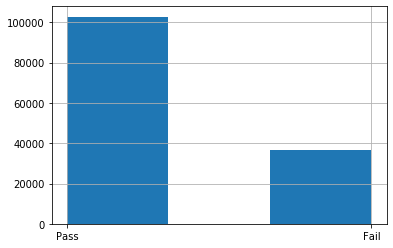

In [10]:
df_binary["Results"].hist(bins = 3)

This graph indicates that the set is skewed. There are more "Pass" than "Fail".

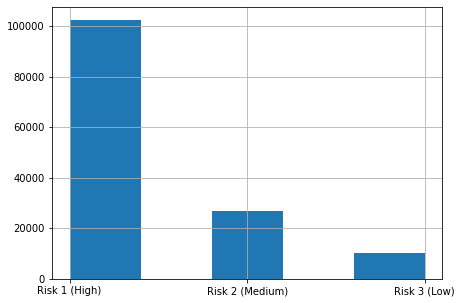

In [11]:
df_binary["Risk"].hist(bins = 5, figsize = (7,5))